# Inference

In [1]:
import os, sys
import warnings
from tqdm import tqdm
import math
import numpy as np
import pandas as pd
from prettytable import PrettyTable
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from rouge import Rouge
from PIL import Image
from dataclasses import dataclass
from datasets import load_dataset, Dataset
import datasets
from typing import Any, Dict, List, Optional, Union


import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import (
    GPT2Model, GPT2Tokenizer,
    
    CLIPVisionModel, CLIPProcessor,
    
    TrainingArguments, Trainer,
    
    logging, set_seed
)

from model import PositionalEncoding, MultimodalFusionModel

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

if device.type == "cuda":
    print(torch.cuda.get_device_name(0))

cuda
NVIDIA GeForce RTX 3090


In [3]:
@dataclass
class MyCollator:
    tokenizer: GPT2Tokenizer
    processor: CLIPProcessor
        
    def tokenize_text(self, texts):
        eos = self.tokenizer.eos_token
        texts = [eos + x + eos for x in texts]
        
        encoded_text = self.tokenizer(
            texts,
            padding="longest",
            return_tensors="pt",
            return_attention_mask=True,
        )
        return {
            "input_ids": encoded_text["input_ids"].squeeze(),
            "attention_mask": encoded_text["attention_mask"].squeeze(),
        }
        
    def tokenize_labels(self, labels):
        eos = self.tokenizer.eos_token
        labels = [eos + x + eos for x in labels]
        
        encoded_labels = self.tokenizer(
            labels,
            padding="longest",
            return_tensors="pt",
            return_attention_mask=True,
        )
        
        inv_bool_attention_mask = (1 - encoded_labels["attention_mask"]) > 0
        encoded_labels["input_ids"][inv_bool_attention_mask] = -100
        
        return {
            "labels": encoded_labels["input_ids"].squeeze(),
        }
        
    def process_image(self, images):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            processed_images = self.processor(
                images=[Image.open(os.path.join("..", "datasets/AVA/images", image_id)).convert('RGB') for image_id in images],
                return_tensors="pt",
                )
        return {
            "pixel_values": processed_images["pixel_values"].squeeze(),
        }
    
    def __call__(self, raw_batch_dict):        
        return {
            **self.tokenize_text(
                raw_batch_dict['caption']
                if isinstance(raw_batch_dict, dict) else
                [i['caption'] for i in raw_batch_dict]
            ),
            **self.process_image(
                raw_batch_dict['image_id']
                if isinstance(raw_batch_dict, dict) else
                [i['image_id'] for i in raw_batch_dict]
            ),
            **self.tokenize_labels(
                raw_batch_dict['caption']
                if isinstance(raw_batch_dict, dict) else
                [i['caption'] for i in raw_batch_dict]
            ),
        }

In [4]:
# https://stackoverflow.com/questions/49201236/check-the-total-number-of-parameters-in-a-pytorch-model
def count_parameters(model):
    table = PrettyTable(['Modules', 'Parameters'])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        params = parameter.numel()
        table.add_row([name, params])
        total_params+=params
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params

In [5]:
def createCollatorAndModel(text="gpt2", image="openai/clip-vit-base-patch32"):
    tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
    processor = CLIPProcessor.from_pretrained(image)
    
    tokenizer.pad_token = tokenizer.eos_token
    tokenizer.padding_side = "right"
    
    mycollator = MyCollator(tokenizer=tokenizer, processor=processor)
    model = MultimodalFusionModel(text, image, tokenizer.vocab_size)
    
    return mycollator, model.to(device)

In [6]:
def showExample(data, id=None):
    
    if id is None:
        id = torch.randint(len(data['image_id']), size=(1,)).item()
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        img = Image.open(os.path.join("../datasets/AVA/images", data[id]['image_id']))
    print("Caption:", data[id]['caption'])
    print("Image ID:", data[id]['image_id'])
    display(img)
    

In [7]:
def top_k_top_p_filtering(
    next_token_logits: torch.FloatTensor,
    top_k: Optional[float]=None, 
    top_p: Optional[float]=None,
    device: Union[str, torch.device]="cpu",
) -> torch.FloatTensor:
    # https://colab.research.google.com/github/sachinruk/blog/blob/master/_notebooks/2021-12-28-vit-to-gpt2-encoder-decoder-model.ipynb#scrollTo=806799ae
    if top_k is None:
        top_k = next_token_logits.shape[-1]
    if top_p is None:
        top_p = 1.0
        
    p, largest_p_idx = F.softmax(next_token_logits, dim=-1).topk(top_k, dim=-1)
    cumulative_p = p.cumsum(dim=-1)
    threshold_repeated = top_p + torch.zeros((len(p),1)).to(device)
    idx = torch.searchsorted(cumulative_p, threshold_repeated).clip(max=top_k-1).squeeze()
    cutoffs = cumulative_p[torch.arange(len(cumulative_p)), idx]
    censored_p = (cumulative_p <= cutoffs[:, None]) * p
    renormalized_p = censored_p / censored_p.sum(dim=-1, keepdims=True)
    
    final_p = torch.zeros_like(next_token_logits)
    row_idx = torch.arange(len(p)).unsqueeze(1).repeat(1,top_k).to(device)
    final_p[row_idx, largest_p_idx] = renormalized_p.to(final_p.dtype)

    return final_p

In [8]:
def generate_sentence_from_image(model, pixel_values, tokenizer, max_text_length: int, top_k=50, top_p=.95):
    # len(pixel_values) = batch_size
    generated_so_far = torch.LongTensor([[tokenizer.bos_token_id]] * len(pixel_values)).to(device)
    
    with torch.no_grad():
        for _ in tqdm(range(max_text_length)):
            attention_mask = torch.ones_like(generated_so_far)
            
            outputs = model(
                input_ids=generated_so_far,
                attention_mask=attention_mask,
                pixel_values=pixel_values,
                labels=None,
            )
            
            next_token_logits = outputs['logits'][:, -1, :]
            filtered_p = top_k_top_p_filtering(next_token_logits, top_k=top_k, top_p=top_p, device=device)
            next_token = torch.multinomial(filtered_p, num_samples=1)
            # next_token = next_token_logits.argmax(dim=1).unsqueeze(-1)
            generated_so_far = torch.cat([generated_so_far, next_token], dim=1)
    
    # Truncate sentence at eos token
    output = []
    for coded_sentence in generated_so_far:
        coded_sentence = coded_sentence[1:]
        sentence_list = coded_sentence.tolist()
        idx = sentence_list.index(tokenizer.eos_token_id) if tokenizer.eos_token_id in sentence_list else len(sentence_list)
        output.append(coded_sentence[:idx])
    
    return [tokenizer.decode(coded_sentence, skip_special_tokens=False) for coded_sentence in output]

In [9]:
#text_model_type = '../CLIP-GPT2/models/gpt2-small-AVA/checkpoint-20500'
text_model_type = 'gpt2'
image_model_type = 'openai/clip-vit-base-patch16'

In [10]:
logging.set_verbosity_error()
tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

mycollator, model = createCollatorAndModel(text=text_model_type, image=image_model_type)
model.load_state_dict(torch.load('../CLIP-GPT2/models/clip-gpt2/b32-small/checkpoint-10000/pytorch_model.bin'))
model.to(device)
print("--loaded--")

--loaded--


In [11]:
dataset = load_dataset(
    "csv",
    data_files={
        "train": "../CLIP-GPT2/data/clip-gpt2/train.csv",
        "validate": "../CLIP-GPT2/data/clip-gpt2/validate.csv",
        "test": "../CLIP-GPT2/data/clip-gpt2/test.csv",
    }
)

reference_dataset = pd.read_feather("../CLIP-GPT2/data/clip-gpt2/reference.feather")

Using custom data configuration default-0415f7da8ddffed3
Found cached dataset csv (C:/Users/Keenan Samway/.cache/huggingface/datasets/csv/default-0415f7da8ddffed3/0.0.0/6b34fb8fcf56f7c8ba51dc895bfa2bfbe43546f190a60fcf74bb5e8afdcc2317)


  0%|          | 0/3 [00:00<?, ?it/s]

In [12]:
start_idx = 50
end_idx = 100

In [13]:
sample = mycollator(dataset['test'][start_idx:end_idx])
pixel_values = sample['pixel_values'].to(device)
image_ids = dataset['test'][start_idx:end_idx]['image_id']

In [14]:
TOP_K = 1000
TOP_P = 1
model.eval()
outputs = generate_sentence_from_image(model, pixel_values, tokenizer, max_text_length=40, top_k=TOP_K, top_p=TOP_P)

100%|██████████| 40/40 [00:12<00:00,  3.08it/s]


In [15]:
bleu = []
rouge = []
reference_list = []
candidate_list = []

smoothingfunction = SmoothingFunction().method1
for i in range(0, end_idx-start_idx):
    references = reference_dataset.loc[reference_dataset['image_id']==image_ids[i], 'captions'].iloc[0].tolist()
    candidate = outputs[i]
    b = sentence_bleu(references, candidate, weights=[0.25, 0.25, 0.25, 0.25], smoothing_function=smoothingfunction)
    bleu.append(b)
    r = Rouge().get_scores(candidate, references[0])
    rouge.append(r)
    
    reference_list.append(references)
    candidate_list.append(candidate)

In [16]:
average_rouge = np.mean([r[0]['rouge-l']['f'] for r in rouge])
print(average_rouge)

0.09171561052506157


In [17]:
average_bleu = sum(bleu)/len(bleu)
print(average_bleu)

0.5241290356319949


In [ ]:
x = 7
print(reference_list[x])
print("-------------------------------")
print(candidate_list[x])
print(bleu[x])

-------------------------
Prediction: love the sep photos, overall the angle is just very nice.
BLEU-4:  0.6875679244472922
Caption: very nice! quite abstract but i like it. good colors. what is that in the background? interesting texture.
Image ID: 2879.jpg


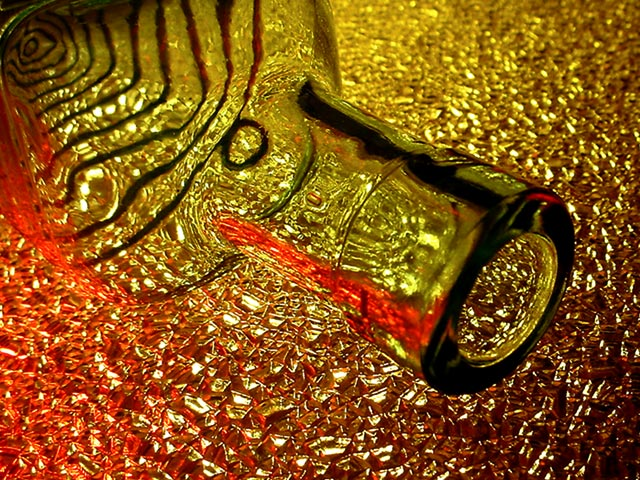

-------------------------
-------------------------
Prediction: good shot! such a interesting subject. nice work to use and little more the foreground i like that its not in black and sky this is outalxposed.
BLEU-4:  0.6595176528579866
Caption: positives i really like the toning here the way the white on the top sign stands out so much and i like the way you have been proactive in your framing.
Image ID: 874909.jpg


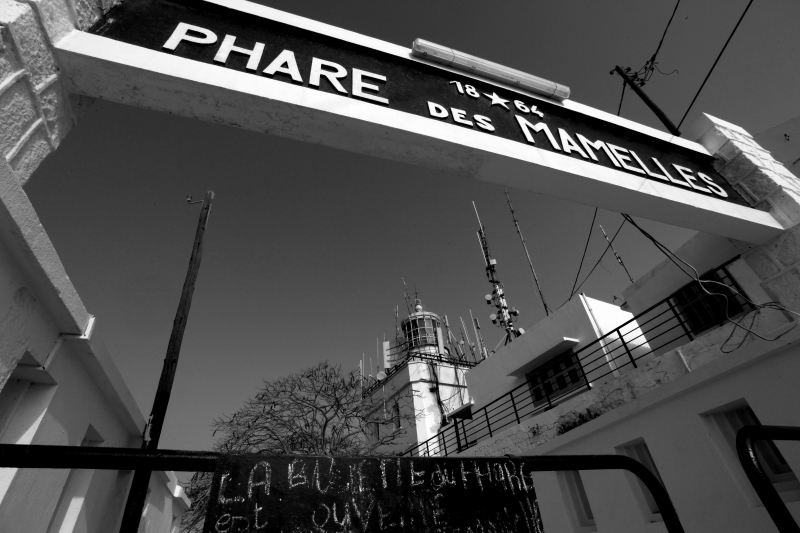

-------------------------
-------------------------
Prediction: overindall this is not beautiful.
BLEU-4:  0.3072251789316152
Caption: very nice.great use of blur and color
Image ID: 943485.jpg


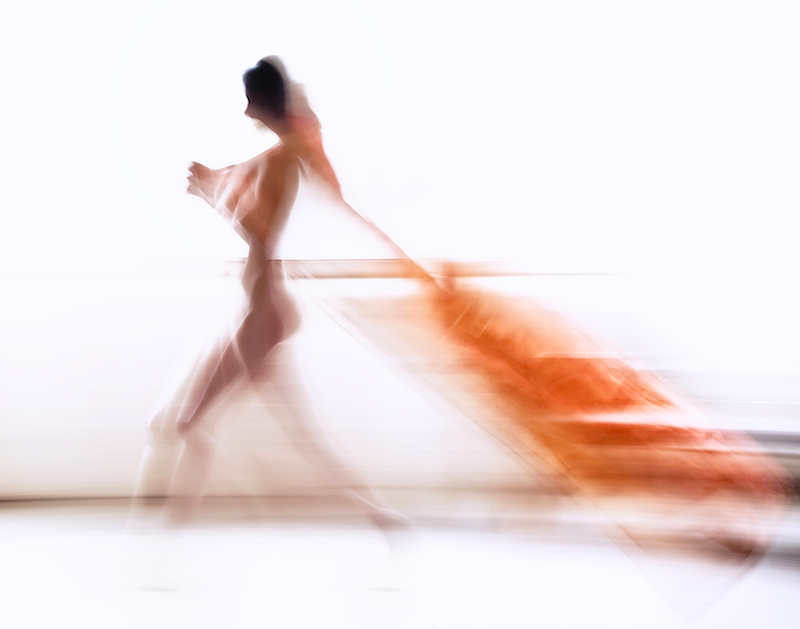

-------------------------
-------------------------
Prediction: the foreground on the bottom had a bit a lot to work out here.
BLEU-4:  0.6243152621403356
Caption: too bad the shop behind is so brightly lit.
Image ID: 586644.jpg


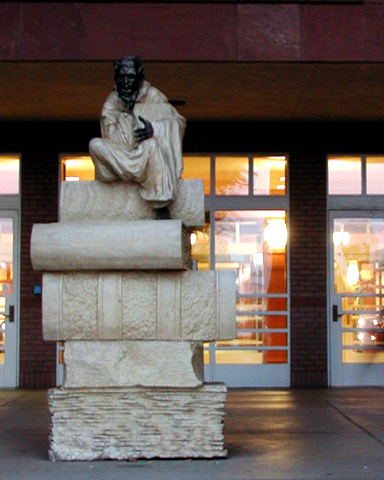

-------------------------
-------------------------
Prediction: great use, but i especially too the lighting might have been nice to see if it was more off any bag if i'd put the white of the wall at the right of the frame. maybe i
BLEU-4:  0.5316725357000325
Caption: partial stegosaurus probably a fake one
Image ID: 936688.jpg


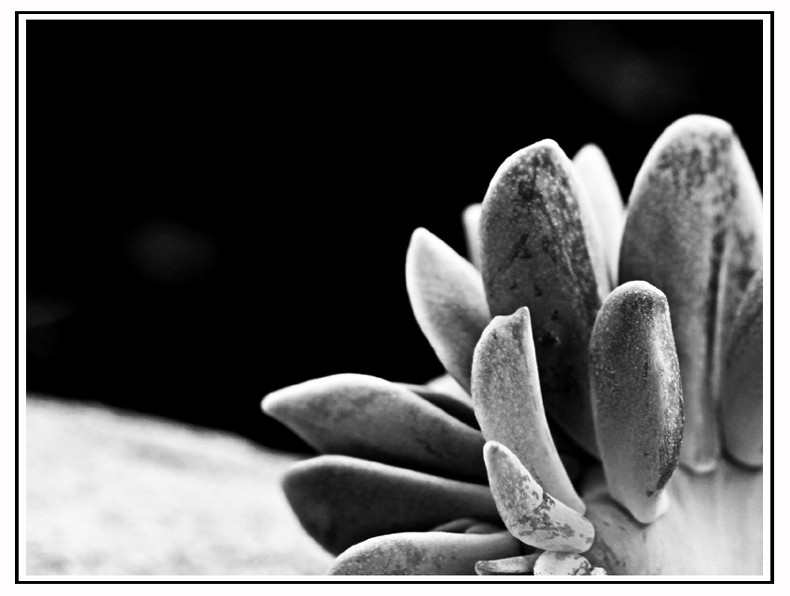

-------------------------
-------------------------
Prediction: i like this hplets, i can't say i want to see what blowinged. nice texture without the small red colorless detractochicheness.
BLEU-4:  0.3866904406456154
Caption: well done becky.too funny
Image ID: 382804.jpg


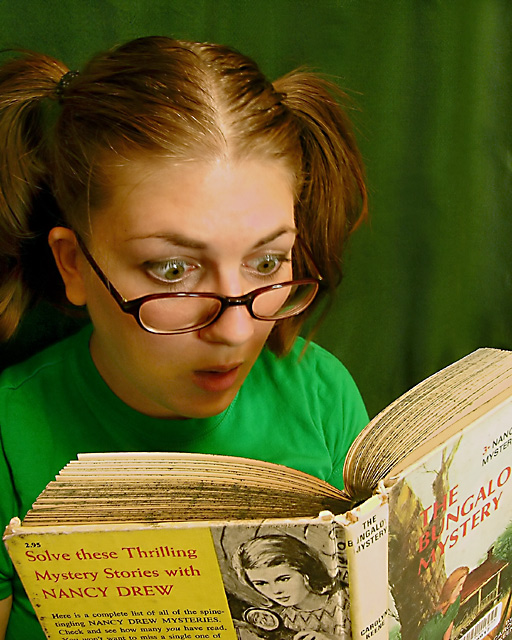

-------------------------
-------------------------
Prediction: aww, what there is a blur. dark border coming for a shadow side would have made this even an otherwise interesting shot
BLEU-4:  0.37467118992007903
Caption: sucker for the ballet, beautiful
Image ID: 929620.jpg


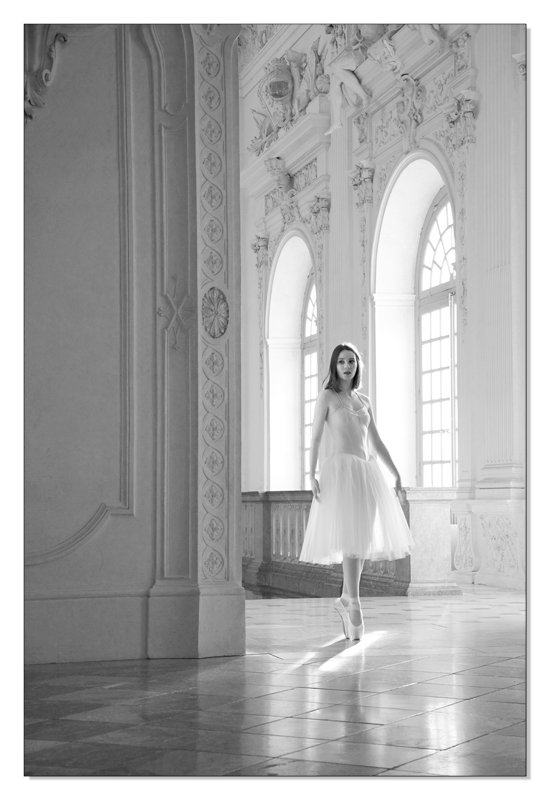

-------------------------
-------------------------
Prediction: i agree, a very much black white on the right
BLEU-4:  0.6311582571756668
Caption: wow, very striking. i love the blue and red, the green could do with being a bit more vibrant. the thing that really puts me off is the glare. could you have sorted this with a polariser? wonderful composition.
Image ID: 108984.jpg


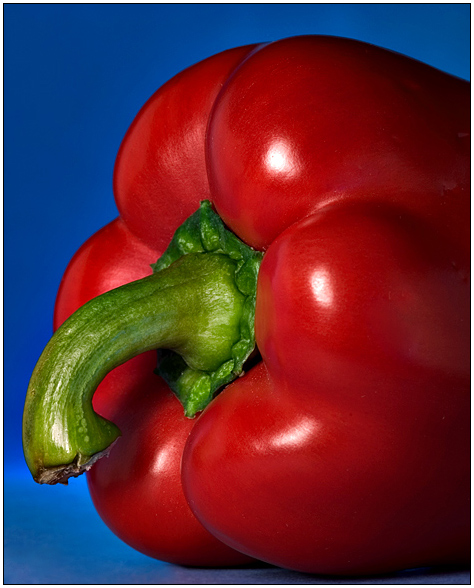

-------------------------
-------------------------
Prediction: very nice. very nice image.cute expression and shapes.
BLEU-4:  0.6262548791701157
Caption: gorgeous setting. lovely tonal range. great composition.
Image ID: 425658.jpg


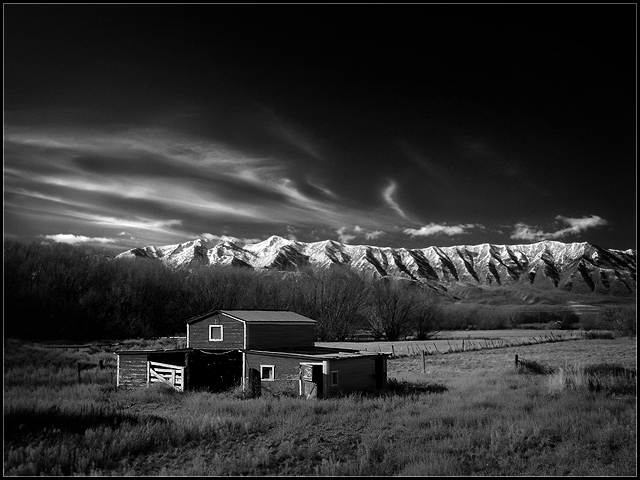

-------------------------
-------------------------
Prediction: unation. good story! very well executed are my taste
BLEU-4:  0.8379444616038212
Caption: nice use of depth of field
Image ID: 292023.jpg


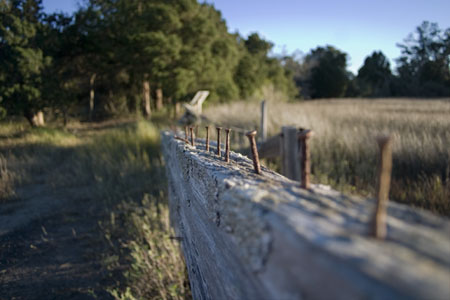

-------------------------
-------------------------
Prediction: very nice line and everything. i'd've cropped closer to the own bit bit to make it seen from the bottom there. nice job.
BLEU-4:  0.4912046671864025
Caption: a suggestion re crop to portrait format removing the town on the left and the houses to the right of the castle. see how that looks.
Image ID: 696920.jpg


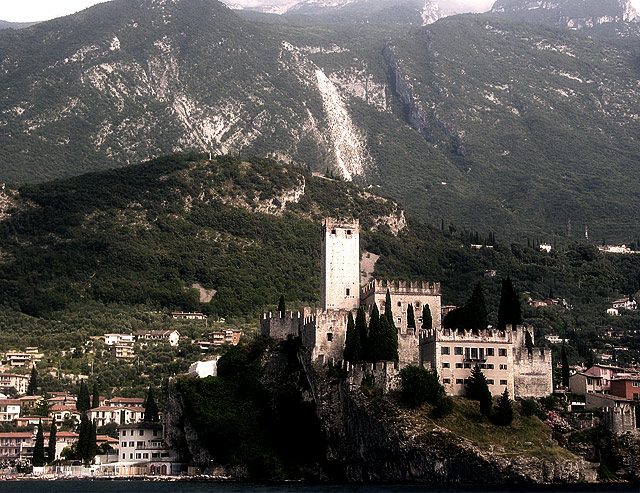

-------------------------
-------------------------
Prediction: this is well set on a favourite photo. get me all small or maybe it is's
BLEU-4:  0.6821387870588306
Caption: i love the wide angle and the sharpness and desat in this.well done
Image ID: 336272.jpg


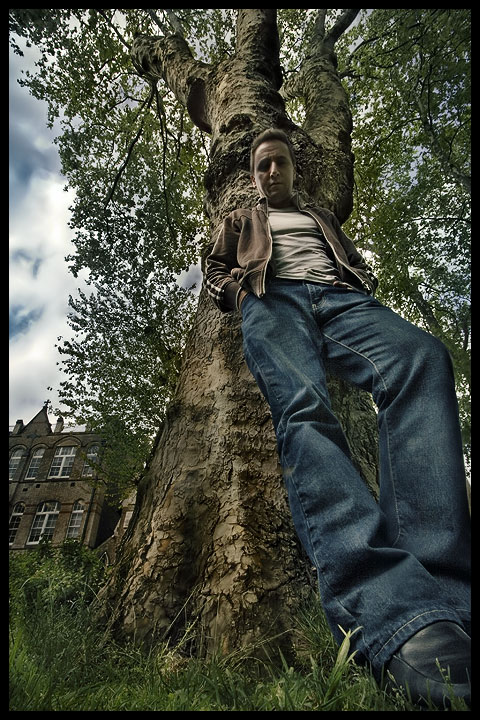

-------------------------
-------------------------
Prediction: very noisy, interesting! all the feeling in this shotlerically executed photo! like the lighting. well done.
BLEU-4:  0.4950778204288341
Caption: oops under the back feet. i like the lighting and the idea, but the milk's in the wrong place. no sense crying over it tho.
Image ID: 221699.jpg


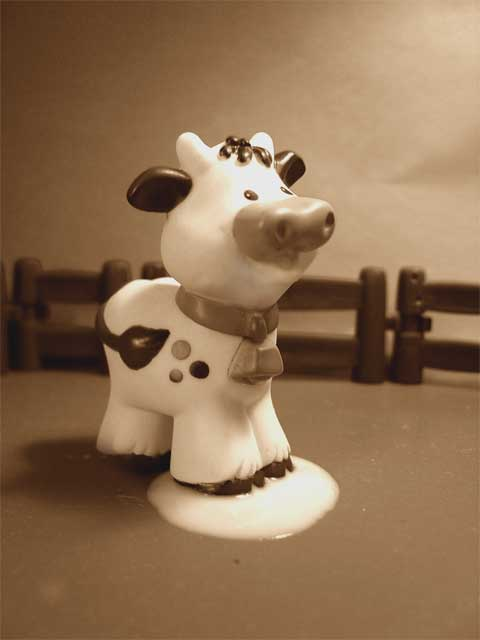

-------------------------
-------------------------
Prediction: just sure i get how you know how you know they taste before no longer missing the reflections shot by free editing of a little like the power. glots always sit there.
BLEU-4:  0.24357649245491683
Caption: this is a fun setup. the face seems a bit dark, but good pose and capture.
Image ID: 315817.jpg


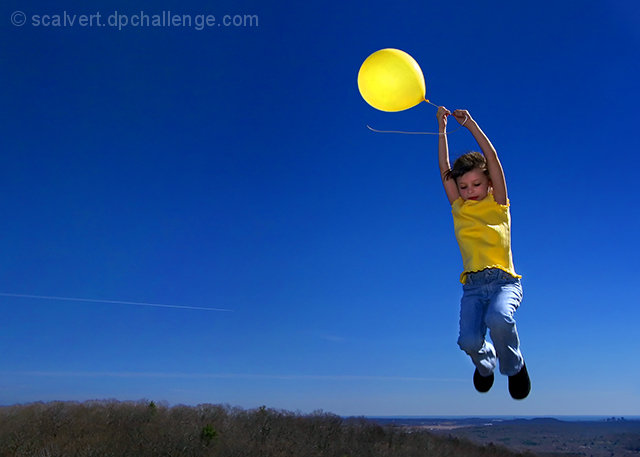

-------------------------
-------------------------
Prediction: is that the tower on the left do not this yet. maybe this is just really fun? beautiful shot which makes that camera yours.
BLEU-4:  0.8053192347044368
Caption: i love the softness and subtlety of this shot. you did a great job with dodging and burning there seems to be a certain magic to the light.
Image ID: 532093.jpg


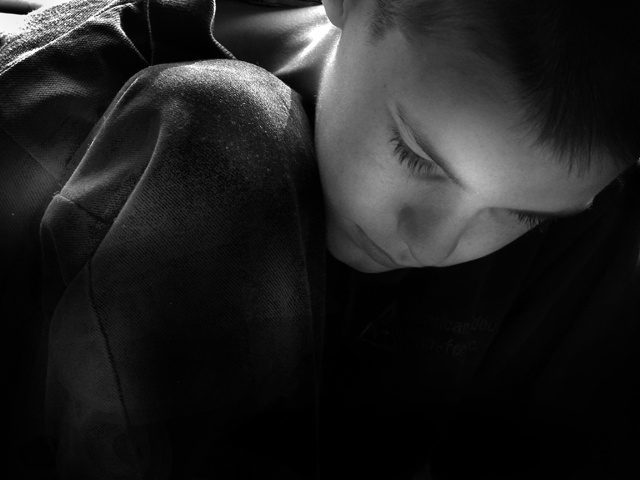

-------------------------
-------------------------
Prediction: great idea. reminds a story slightly more smoke or a bit too sharp.
BLEU-4:  0.5118804252758892
Caption: composition is good on this shot, but i find it rather lacking in lighting. the sky is very noisy, and the overall appearance is just a little flat. you've really nailed the symmetry.
Image ID: 112263.jpg


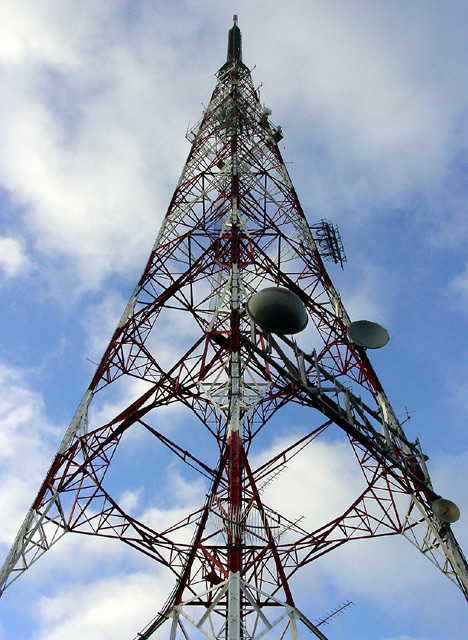

-------------------------
-------------------------
Prediction: i think like youshe conveghes this from me, very well done and very well composed. shadows are a racea blur with some light because of the shadows as sharp background. doesn't sure
BLEU-4:  0.6713347627903177
Caption: aww. well done. for some reason i think i would have liked to see the babywatcher and the dark area to the left to switch places. but it is a great pic
Image ID: 245923.jpg


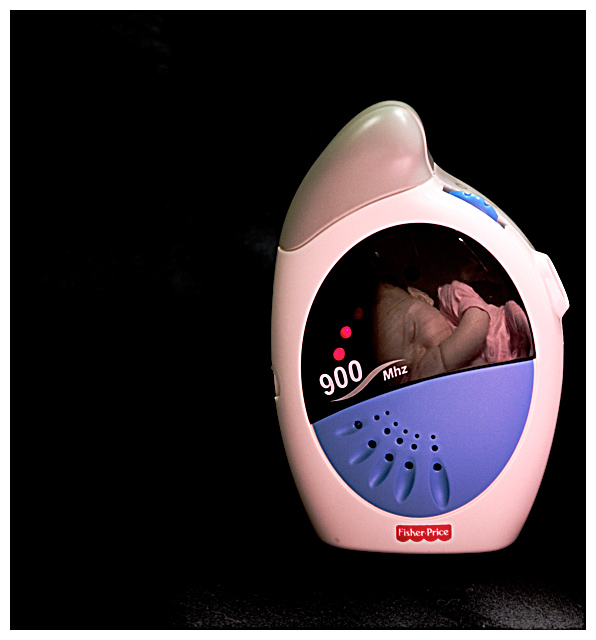

-------------------------
-------------------------
Prediction: good control right and contrast scene as well
BLEU-4:  0.6647098743694467
Caption: i really like this. nice light and exposure. cool shapes and nice textures too.
Image ID: 798869.jpg


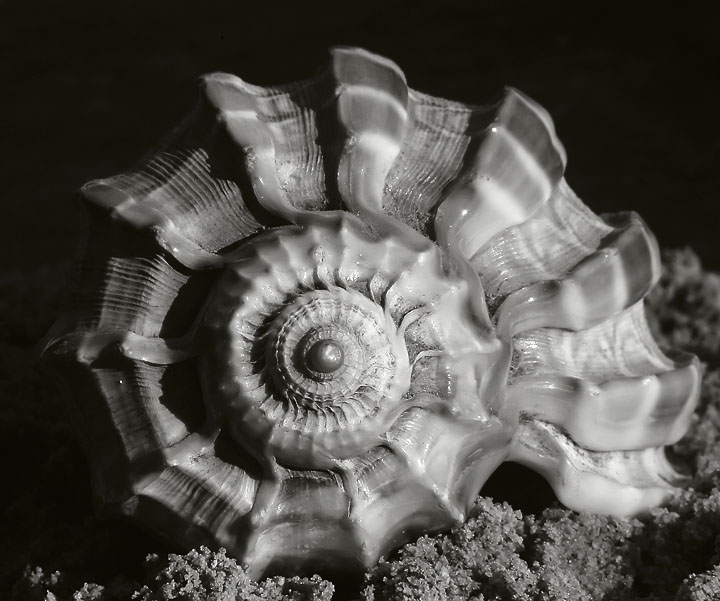

-------------------------
-------------------------
Prediction: itifully looks like your bird was artyway that was taken over, because it looks real. loved the road to this world and the old dog though.
BLEU-4:  0.5384392216763296
Caption: first, as some commenters said, make the image bigger. you can have on the longest side so try and use it all up!
Image ID: 470310.jpg


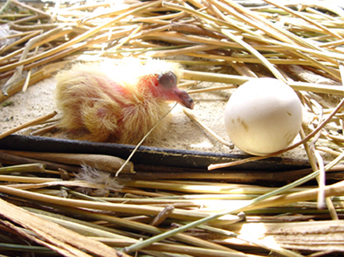

-------------------------
-------------------------
Prediction: i have no dof, very beautiful capture. top
BLEU-4:  0.7922696536283538
Caption: cute looks real! nice composition and placement. the white on the right side seems a bit hot.
Image ID: 88409.jpg


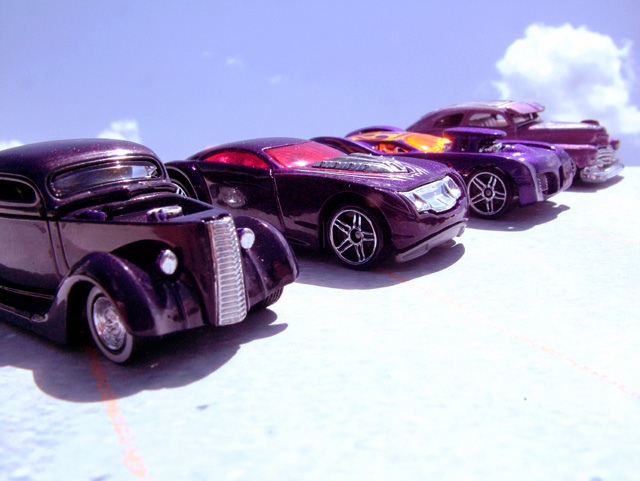

-------------------------
-------------------------
Prediction: great artistic lighting simple and good use of motion. you really captured cool life of water for the winner. hope there is already causing something at fine one?
BLEU-4:  0.646192400735785
Caption: would an artist throw away a pencil? and a sharp on at that?
Image ID: 254902.jpg


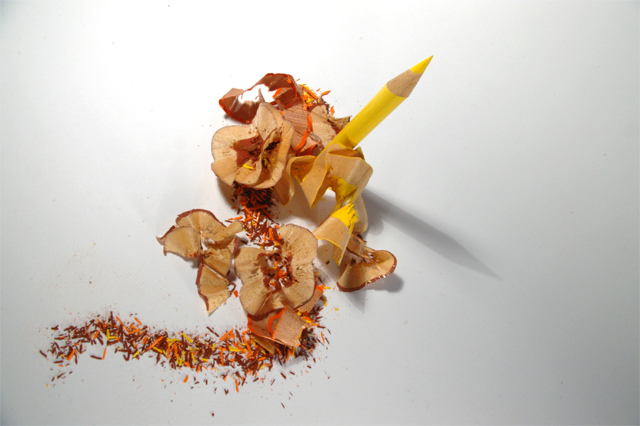

-------------------------
-------------------------
Prediction: probably too big of some flowers, but suppose the background had too much detail
BLEU-4:  0.5178233712337977
Caption: i like the urban monochrome shot looks terrific.
Image ID: 92706.jpg


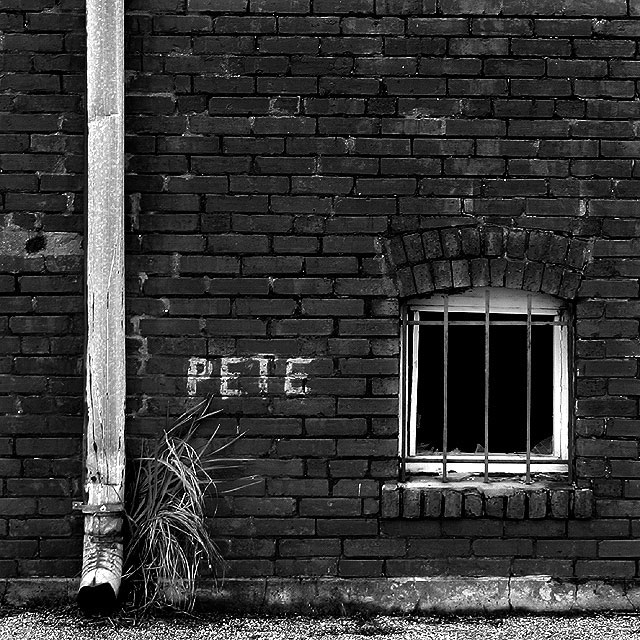

-------------------------


In [18]:
for i in range(0, end_idx-start_idx):
    print("-------------------------")
    print("Prediction:", outputs[i])
    print("BLEU-4: ", bleu[i])
    showExample(dataset['train'], i+start_idx)
    print("-------------------------")
    if i > 20: break